Making the Important `imports `

In [1]:
import librosa
import librosa.display
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.fft import fft
import scipy.signal as signal
from scipy.signal import butter, lfilter, freqz
import math

ModuleNotFoundError: No module named 'librosa'

In [73]:
audio1_file = "/content/electro.wav"
audio2_file = "/content/guitar.wav"

In [74]:
ipd.Audio(audio1_file)

In [75]:
ipd.Audio(audio2_file)

In [77]:
# load audio files with librosa
audio1_data, sr1 = librosa.load(audio1_file)
audio2_data, sr2 = librosa.load(audio2_file, sr=21000)
audio1_data, audio2_data, sr1, sr2

(array([ 5.8319429e-09,  2.4582441e-08,  8.8630756e-09, ...,
         1.2203490e-11,  1.8939308e-11, -1.2514463e-11], dtype=float32),
 array([-0.00134927, -0.00215494, -0.00294537, ..., -0.01340944,
        -0.00660123,  0.        ], dtype=float32),
 22050,
 21000)

In [79]:
# duration in seconds of 1 sample
# mesange
audio1_sample_dur = 1 / sr1
print(f"Audio1 sample lasts for {audio1_sample_dur:6f} seconds")
# n_audio
audio2_sample_dur = 1 / sr2
print(f"Audio2 sample lasts for {audio2_sample_dur:6f} seconds")

Audio1 sample lasts for 0.000045 seconds
Audio2 sample lasts for 0.000048 seconds


Text(0.5, 1.0, 'Audio 2')

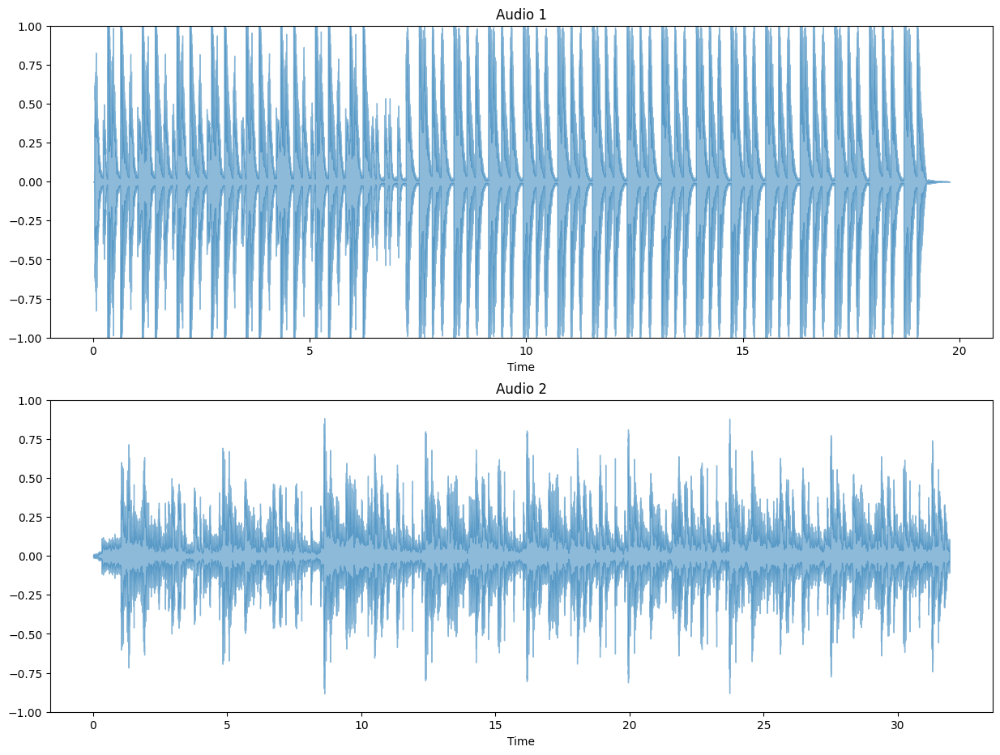

In [80]:
plt.figure(figsize=(15, 17))

plt.subplot(3, 1, 1)
librosa.display.waveshow(audio1_data, alpha=0.5)
plt.ylim((-1, 1))
plt.title("Audio 1")

plt.subplot(3, 1, 2)
librosa.display.waveshow(audio2_data, alpha=0.5)
plt.ylim((-1, 1))
plt.title("Audio 2")

In [81]:
# Calculate the FFT of the audio signals
fft_data_1 = fft(audio1_data)
fft_data_2 = fft(audio2_data)

In [82]:
def plot_magnitude_spectrum(signal, sr, title, f_ratio=1):
    X = np.fft.fft(signal)
    X_mag = np.absolute(X)
    
    plt.figure(figsize=(18, 5))
    
    f = np.linspace(0, sr, len(X_mag))
    f_bins = int(len(X_mag)*f_ratio)  
    
    plt.plot(f[:f_bins], X_mag[:f_bins])
    plt.xlabel('Frequency (Hz)')
    plt.title(title)

<Figure size 1500x1700 with 0 Axes>

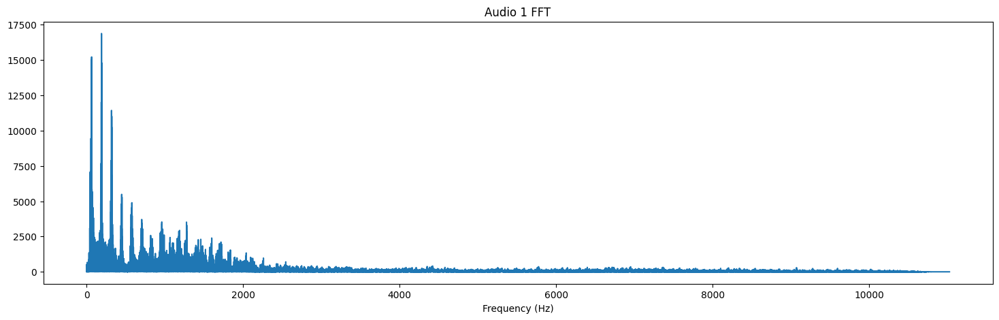

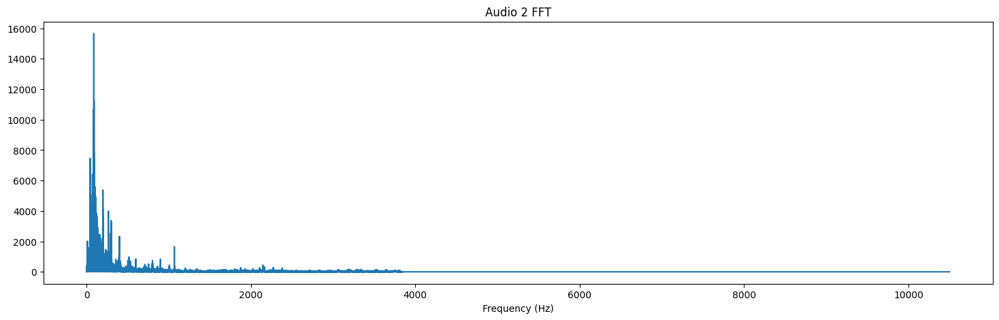

In [83]:
plt.figure(figsize=(15, 17))
plot_magnitude_spectrum(audio1_data, sr1, "Audio 1 FFT", 0.5)
plot_magnitude_spectrum(audio2_data, sr2, "Audio 2 FFT", 0.5)

In [84]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [85]:
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y, 
                             sr=sr, 
                             hop_length=hop_length, 
                             x_axis="time", 
                             y_axis=y_axis)
    plt.colorbar(format="%+2.f")

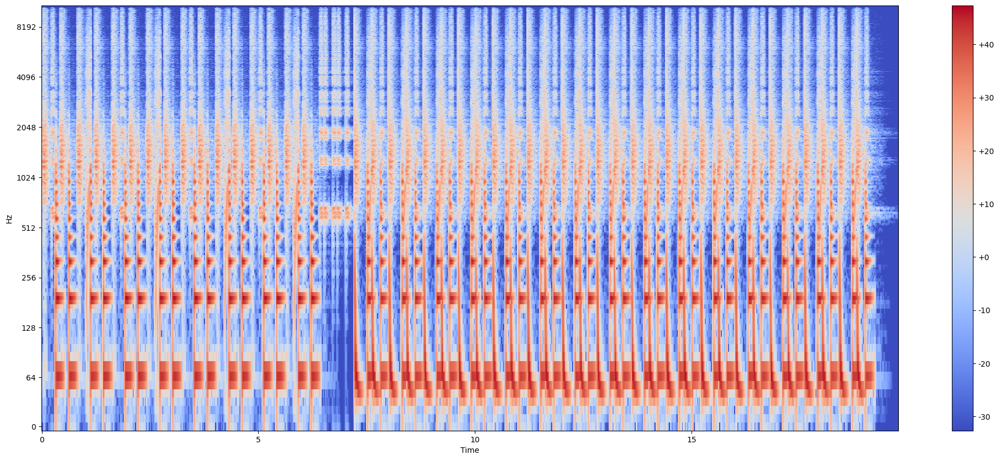

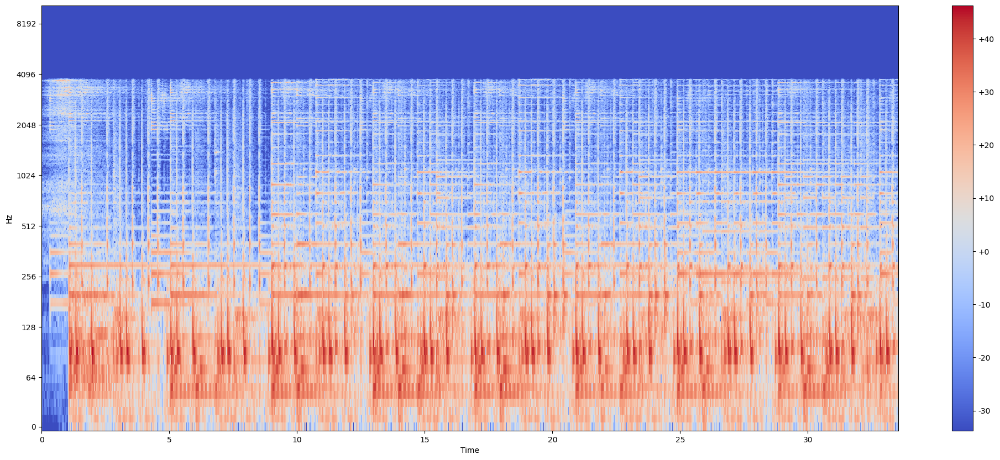

In [86]:
S_audio_1 = librosa.stft(audio1_data, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_audio_2 = librosa.stft(audio2_data, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

Y_audio_1_log = librosa.power_to_db(np.abs(S_audio_1) ** 2)
Y_audio_2_log = librosa.power_to_db(np.abs(S_audio_2) ** 2)

plot_spectrogram(Y_audio_1_log, sr1, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_audio_2_log, sr2, HOP_SIZE, y_axis="log")

In [87]:
def calculate_split_frequency_bin(split_frequency, sample_rate, num_frequency_bins):
    """Infer the frequency bin associated to a given split frequency."""
    
    frequency_range = sample_rate / 2
    frequency_delta_per_bin = frequency_range / num_frequency_bins
    split_frequency_bin = math.floor(split_frequency / frequency_delta_per_bin)
    return int(split_frequency_bin)

In [88]:
def band_energy_ratio(spectrogram, split_frequency, sample_rate):
    """Calculate band energy ratio with a given split frequency."""
    
    split_frequency_bin = calculate_split_frequency_bin(split_frequency, sample_rate, len(spectrogram[0]))
    band_energy_ratio = []
    
    # calculate power spectrogram
    power_spectrogram = np.abs(spectrogram) ** 2
    power_spectrogram = power_spectrogram.T
    
    # calculate BER value for each frame
    for frame in power_spectrogram:
        sum_power_low_frequencies = frame[:split_frequency_bin].sum()
        sum_power_high_frequencies = frame[split_frequency_bin:].sum()
        band_energy_ratio_current_frame = sum_power_low_frequencies / sum_power_high_frequencies
        band_energy_ratio.append(band_energy_ratio_current_frame)
    
    return np.array(band_energy_ratio)

In [89]:
ber_audio_1 = band_energy_ratio(S_audio_1, 2000, sr1)
ber_audio_2 = band_energy_ratio(S_audio_2, 2000, sr1)

In [93]:
frames_audio_1 = range(len(ber_audio_1))
t_audio_1 = librosa.frames_to_time(frames_audio_1, hop_length=HOP_SIZE)

frames_audio_2 = range(len(ber_audio_2))
t_audio_2 = librosa.frames_to_time(frames_audio_2, hop_length=HOP_SIZE)

Text(0.5, 1.0, 'N_audio')

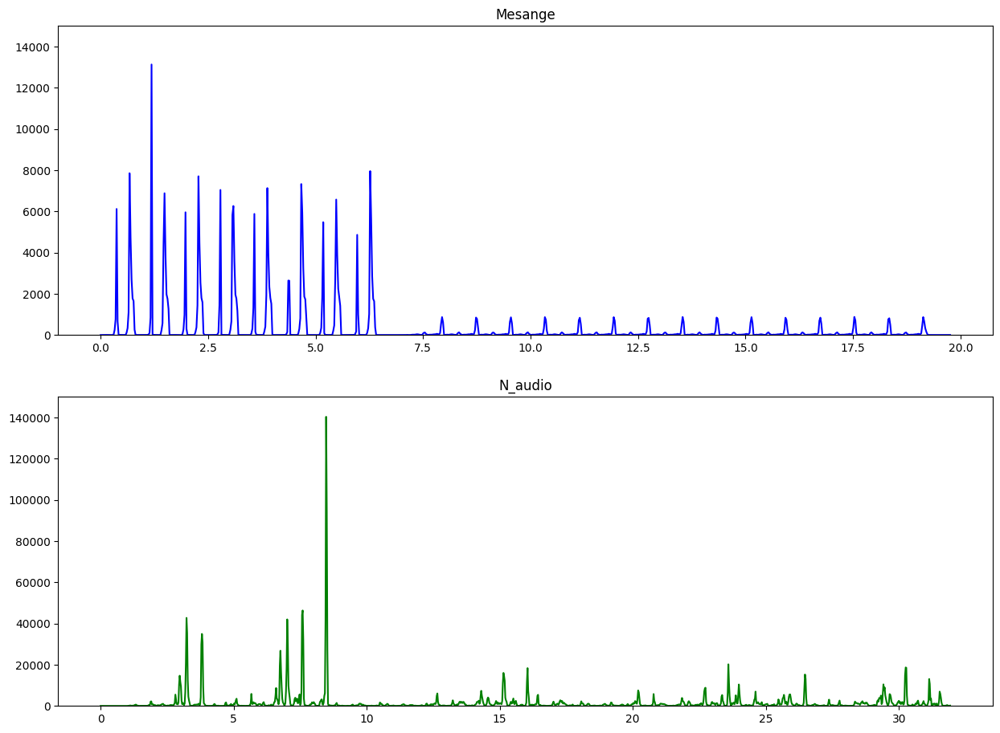

In [118]:
plt.figure(figsize=(15, 17))

plt.subplot(3, 1, 1)
plt.plot(t_audio_1, ber_audio_1, color="b")
plt.ylim((0, 15000))
plt.title("Mesange")

plt.subplot(3, 1, 2)
plt.plot(t_audio_2, ber_audio_2, color="g")
plt.ylim((0, 150000))
plt.title("N_audio")

In [55]:
def generate_13_octave_filter_bank(sr, audio_data):
    """Generate a 1/3 octave filter bank for the given audio data and sample rate."""
    
    # Define filter parameters
    center_frequencies = np.array([
        25, 31.5, 40, 50, 63, 80, 100, 125, 160, 200, 250, 315, 400, 500, 630, 800,
        1000, 1250, 1600, 2000, 2500, 3150, 4000, 5000, 6300, 8000, 10000, 12500, 16000, 20000
    ])
    filter_order = 3
    
    # Generate filter bank
    filter_bank = []
    for cf in center_frequencies:
        nyquist_freq = sr / 2
        freq_range = [cf / (2 ** (1/6)), cf * (2 ** (1/6))]  # Calculate frequency range based on center frequency
        norm_freq_range = [freq / nyquist_freq for freq in freq_range]  # Normalize frequency range
        b, a = signal.butter(filter_order, norm_freq_range, btype='band')  # Generate filter coefficients
        filter_bank.append((b, a))
    
    # Apply filter bank to audio data
    filtered_data = []
    for b, a in filter_bank:
        y = signal.filtfilt(b, a, audio_data)
        filtered_data.append(y)
    
    return filtered_data


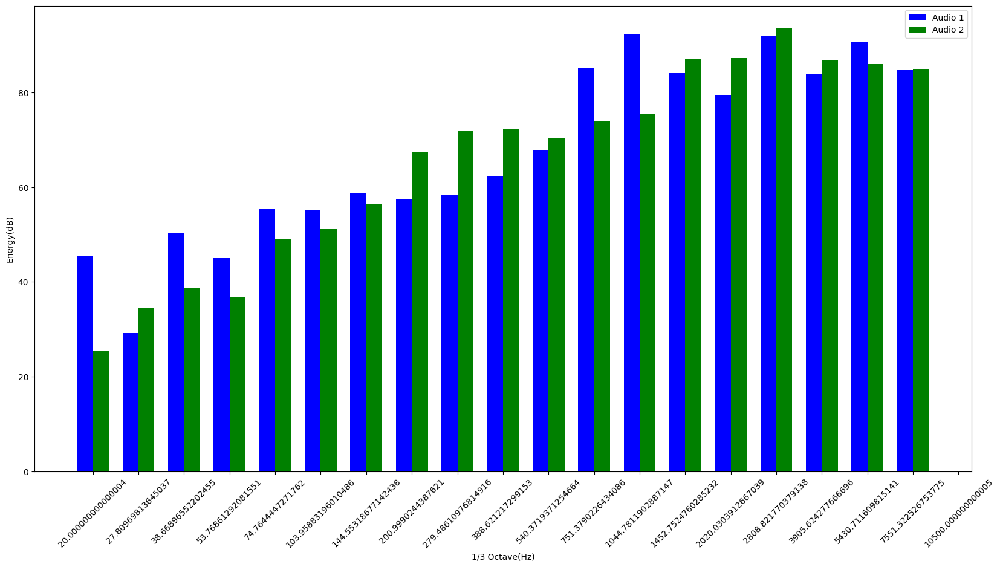

In [117]:
# Generate logarithmically spaced frequencies
third_octave_freqs = np.logspace(np.log10(20), np.log10(min(sr1, sr2) / 2), num=10*2)

# Calculate the energy in each 1/3 octave for the first audio signal
third_octave_energy_1 = []
for i in range(len(third_octave_freqs) - 1):
    third_octave_start = int(third_octave_freqs[i])
    third_octave_end = int(third_octave_freqs[i+1])
    third_octave_fft = fft_data_1[third_octave_start:third_octave_end]
    third_octave_energy_1.append(10 * np.log10(np.sum(np.abs(third_octave_fft) ** 2)))

# Calculate the energy in each 1/3 octave for the second audio signal
third_octave_energy_2 = []
for i in range(len(third_octave_freqs) - 1):
    third_octave_start = int(third_octave_freqs[i])
    third_octave_end = int(third_octave_freqs[i+1])
    third_octave_fft = fft_data_2[third_octave_start:third_octave_end]
    third_octave_energy_2.append(10 * np.log10(np.sum(np.abs(third_octave_fft) ** 2)))

# Plot the energy in each 1/3 octave for both audio signals
bar_width = 0.35
r1 = np.arange(len(third_octave_energy_1))
r2 = [x + bar_width for x in r1]
plt.figure(figsize=(20, 10))
plt.bar(r1, third_octave_energy_1, color='b', width=bar_width, label='Audio 1')
plt.bar(r2, third_octave_energy_2, color='g', width=bar_width, label='Audio 2')
plt.xticks([r + bar_width/2 for r in range(len(third_octave_energy_1)+1)], [f'{x:.1f}' for x in third_octave_freqs], rotation=45)
plt.ylabel('Energy(dB)')
plt.xlabel('1/3 Octave(Hz)')
plt.legend()
plt.show()
